<a href="https://colab.research.google.com/github/ZainabAjayi/House-prdeiction/blob/main/Copy_of_HR_Attrition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Import necessary libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score
import scipy.stats as stats
from sklearn import metrics
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score
import warnings
warnings.filterwarnings('ignore')

### Read the dataset

In [ ]:
hr=pd.read_csv("/content/WA_Fn-UseC_-HR-Employee-Attrition.csv")

In [ ]:
# copying data to another varaible to avoid any changes to original data
data=hr.copy()

### View the first and last 5 rows of the dataset.

In [ ]:
data.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [ ]:
data.tail()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,2068,...,1,80,0,6,3,4,4,3,1,2


### Understand the shape of the dataset.

In [ ]:
data.shape

(1470, 35)

In [ ]:
missing_values = data.isnull().sum()

# Print the number of missing values in each column
print(missing_values)

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

* The dataset has 2940 rows and 35 columns of data

### Check the data types of the columns for the dataset.

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

### Summary of the dataset.

In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.00,36.0,43.00,60.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.00,802.0,1157.00,1499.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.00,7.0,14.00,29.0
Education,1470.0,2.912925,1.024165,1.0,2.00,3.0,4.00,5.0
EmployeeCount,1470.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
EmployeeNumber,1470.0,1024.865306,602.024335,1.0,491.25,1020.5,1555.75,2068.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.0,2.00,3.0,4.00,4.0
HourlyRate,1470.0,65.891156,20.329428,30.0,48.00,66.0,83.75,100.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.00,3.0,3.00,4.0
JobLevel,1470.0,2.063946,1.106940,1.0,1.00,2.0,3.00,5.0


In [ ]:
data.describe(include=['object']).T

,count,unique,top,freq
Attrition,1470,2,No,1233
BusinessTravel,1470,3,Travel_Rarely,1043
Department,1470,3,Research & Development,961
EducationField,1470,6,Life Sciences,606
Gender,1470,2,Male,882
JobRole,1470,9,Sales Executive,326
MaritalStatus,1470,3,Married,673
Over18,1470,1,Y,1470
OverTime,1470,2,No,1054


**Dropping columns which are not adding any information.**

In [ ]:
data.drop(['EmployeeNumber','EmployeeCount','StandardHours','Over18'],axis=1,inplace=True)

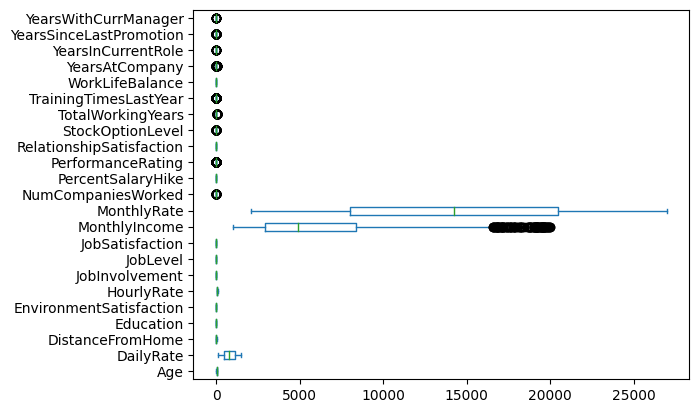

In [ ]:
data.plot.box(vert=False);

<Axes: >

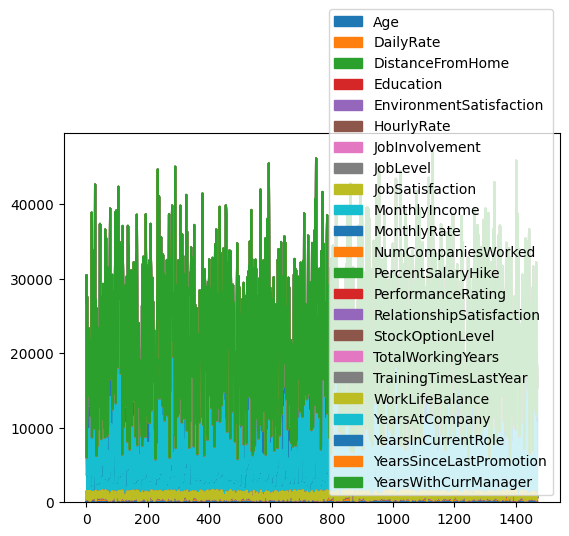

In [ ]:
data.plot.area()

### EDA

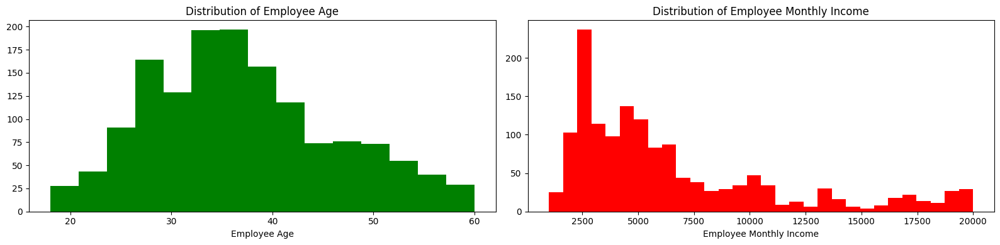

In [ ]:
fig = plt.figure(figsize=(16,4))

# Histogram Plot for Employee Age
plt.subplot(1,2,1)
plt.hist(data['Age'], bins=15, color='green')
plt.title('Distribution of Employee Age')
plt.xlabel("Employee Age")

# Histogram Plot for employee Monthly Income
plt.subplot(1,2,2)
plt.hist(data['MonthlyIncome'], bins=30, color='red')
plt.title('Distribution of Employee Monthly Income')
plt.xlabel("Employee Monthly Income")

fig.tight_layout();

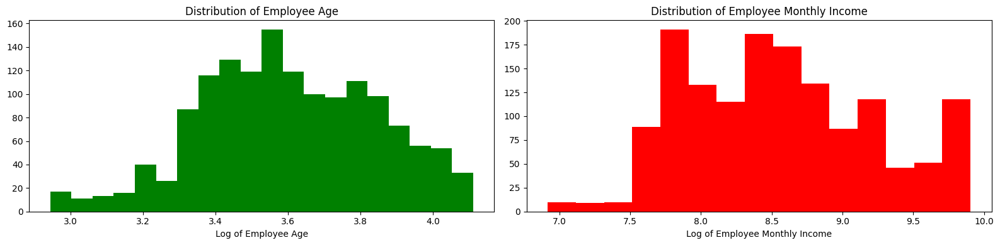

In [ ]:
fig = plt.figure(figsize=(16,4))

# Histogram Plot for Employee Age
plt.subplot(1,2,1)
plt.hist(np.log1p(data['Age']), bins=20, color='green')
plt.title('Distribution of Employee Age')
plt.xlabel("Log of Employee Age")

# Histogram Plot for employee Monthly Income
plt.subplot(1,2,2)
plt.hist(np.log1p(data['MonthlyIncome']), bins=15, color='red')
plt.title('Distribution of Employee Monthly Income')
plt.xlabel("Log of Employee Monthly Income")

fig.tight_layout();

### Univariate analysis

In [ ]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

### Observations on Age

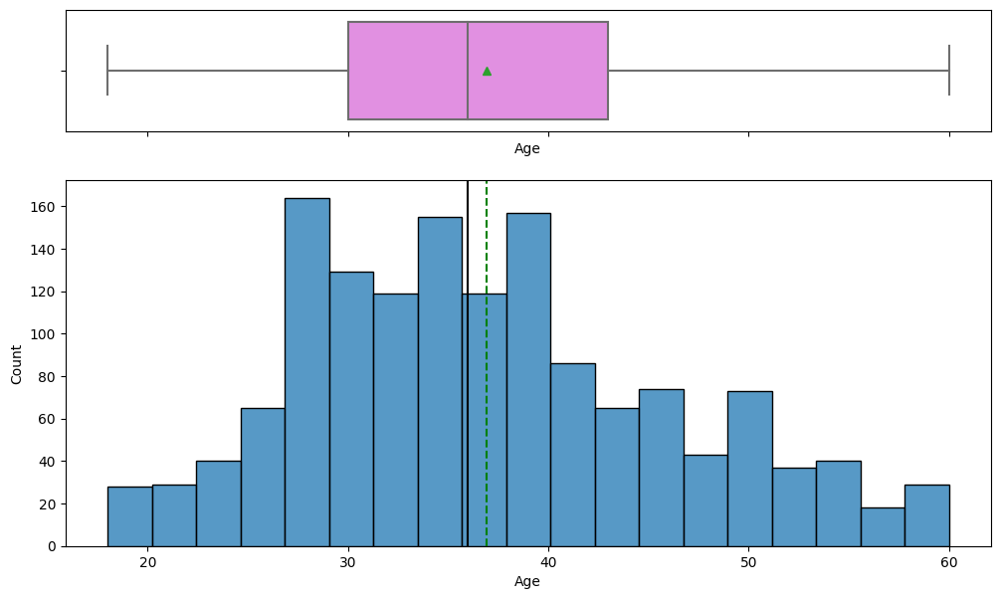

In [ ]:
histogram_boxplot(data,'Age')

### Observations on DailyRate

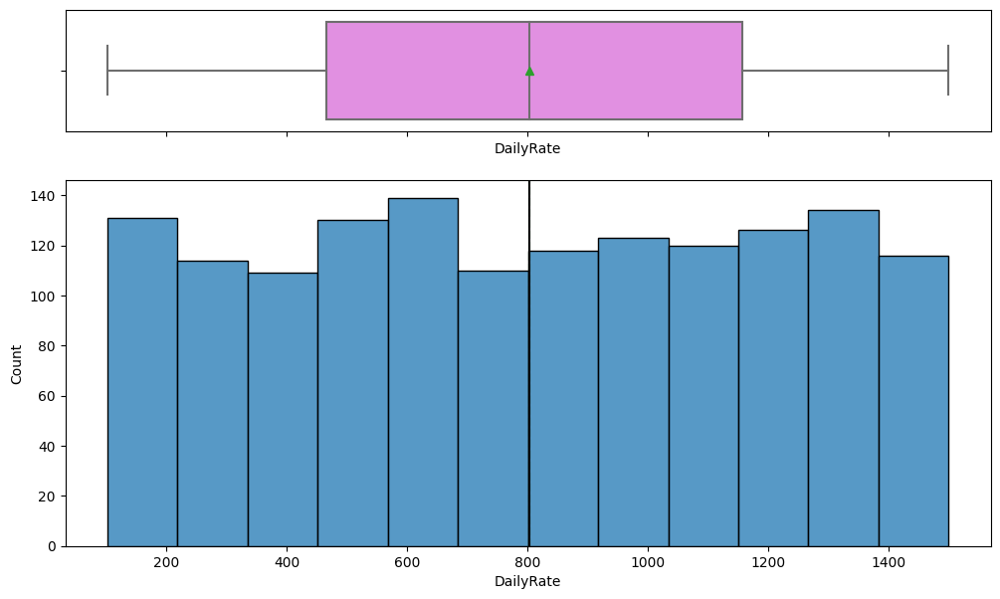

In [ ]:
histogram_boxplot(data,'DailyRate')

### Observations on DistanceFromHome

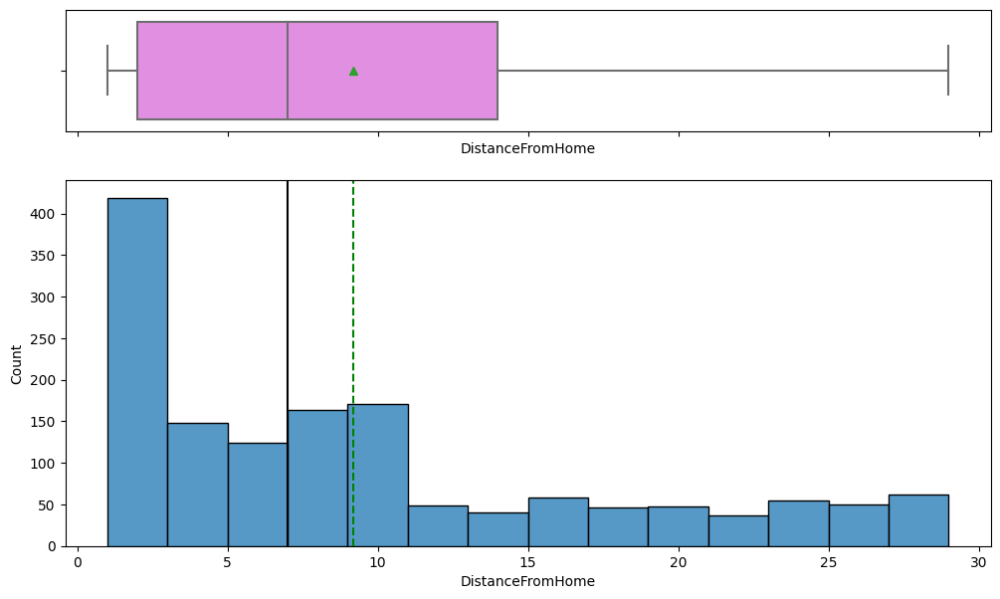

In [ ]:
histogram_boxplot(data,'DistanceFromHome')

### Observations on HourlyRate

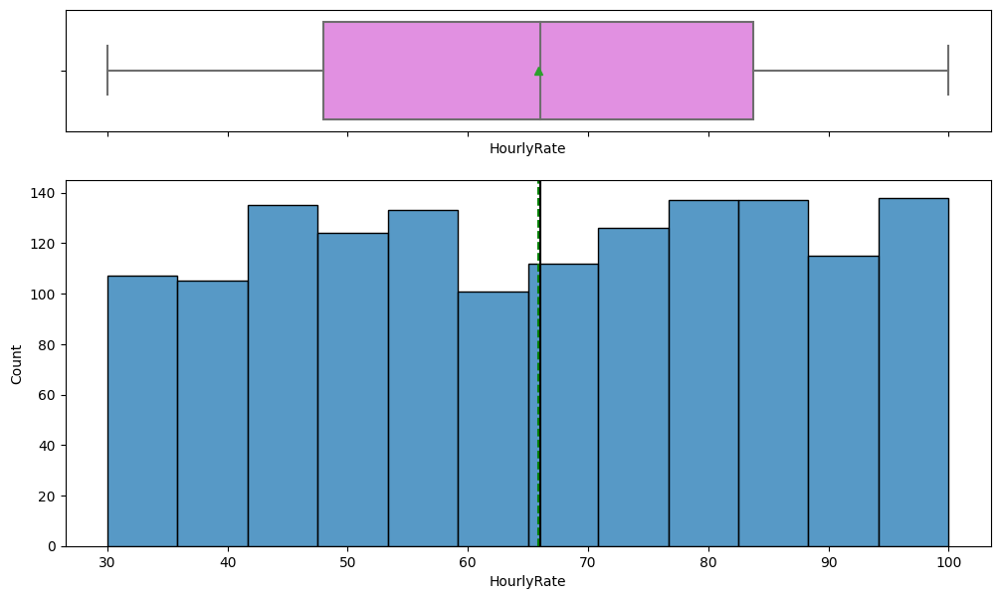

In [ ]:
histogram_boxplot(data,'HourlyRate')

### Observations on MonthlyIncome

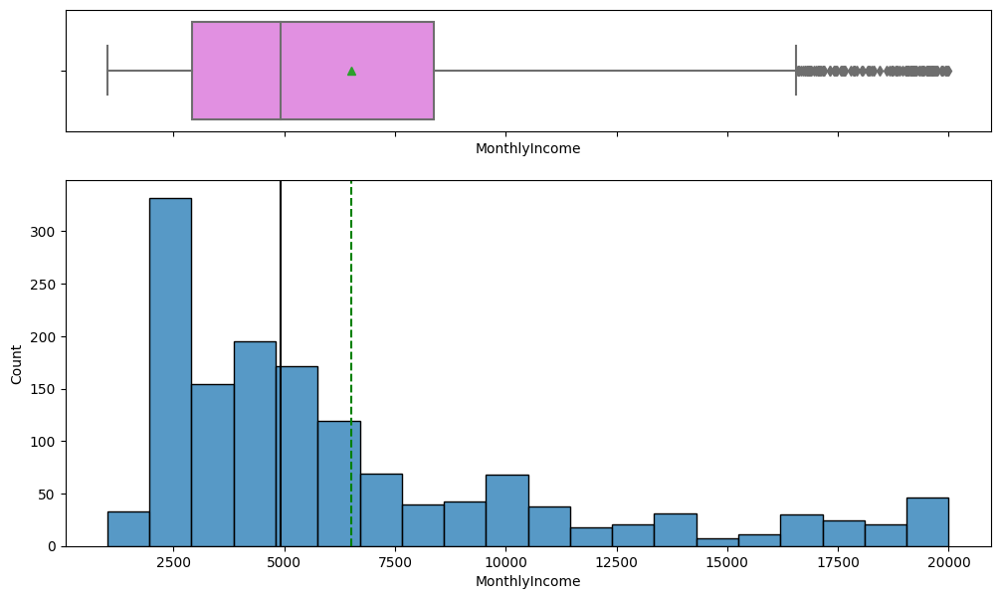

In [ ]:
histogram_boxplot(data,'MonthlyIncome')

### Observations on MonthlyRate

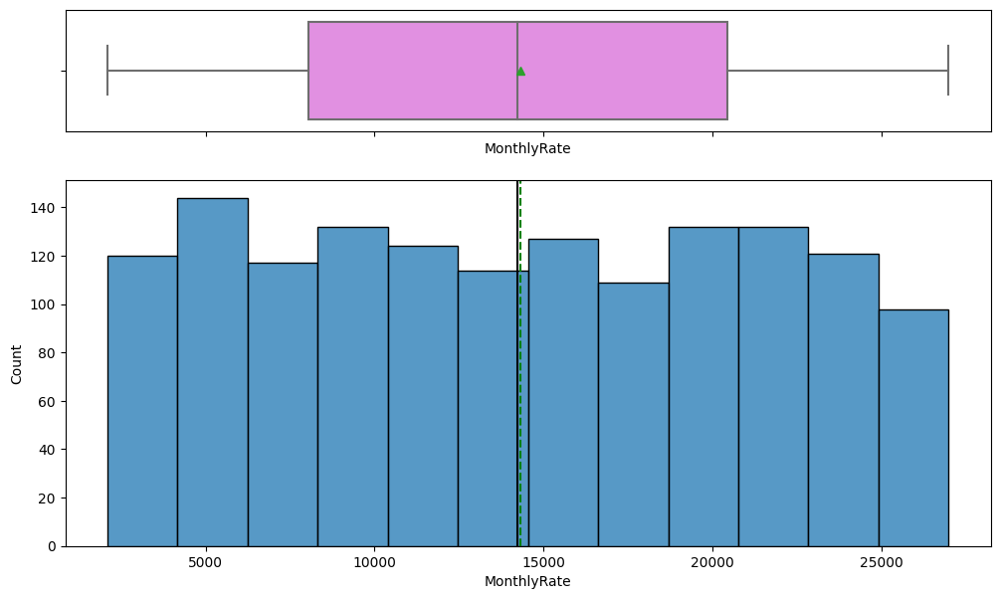

In [ ]:
histogram_boxplot(data,'MonthlyRate')

### Observations on NumCompaniesWorked

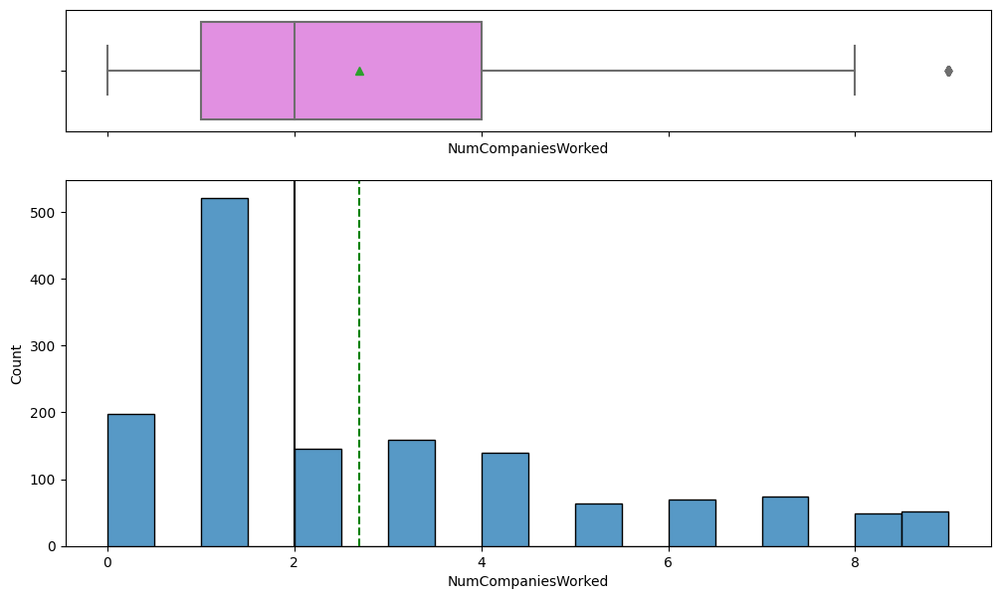

In [ ]:
histogram_boxplot(data,'NumCompaniesWorked')

### Observations on PercentSalaryHike

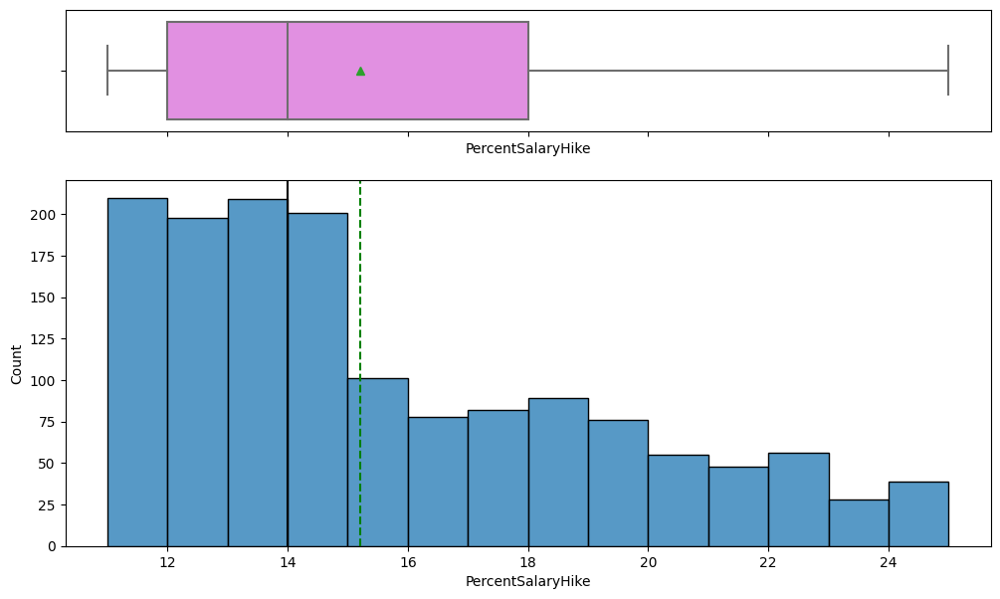

In [ ]:
histogram_boxplot(data,'PercentSalaryHike')

### Observations on TotalWorkingYears

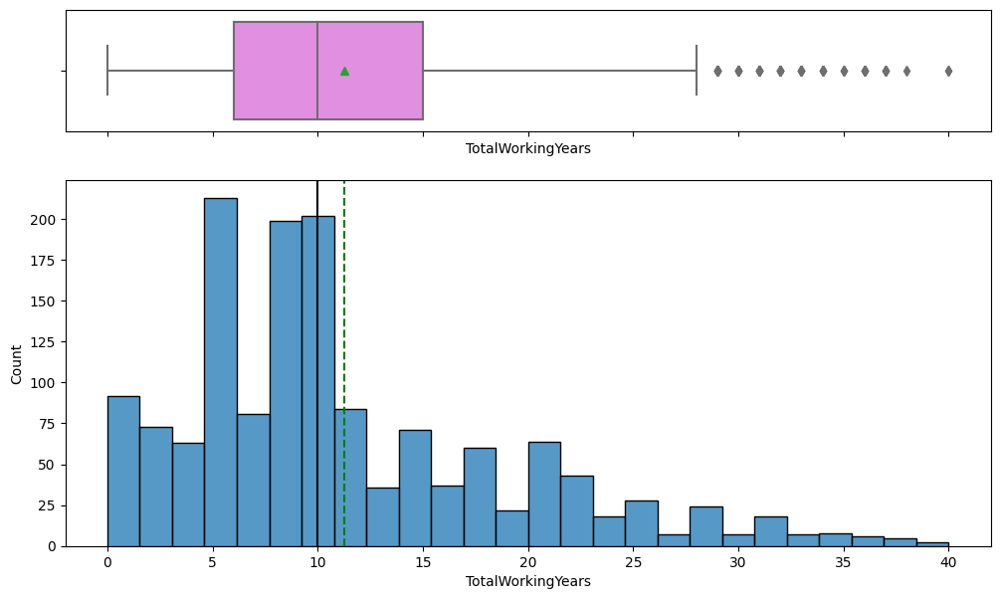

In [ ]:
histogram_boxplot(data,'TotalWorkingYears')

### Observations on YearsAtCompany

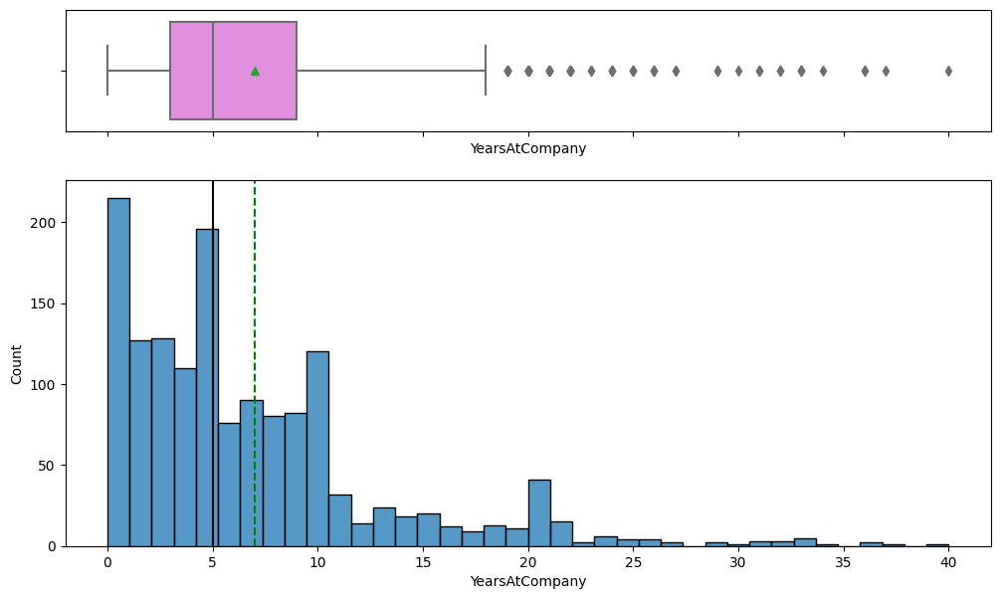

In [ ]:
histogram_boxplot(data,'YearsAtCompany')

### Observations on YearsInCurrentRole

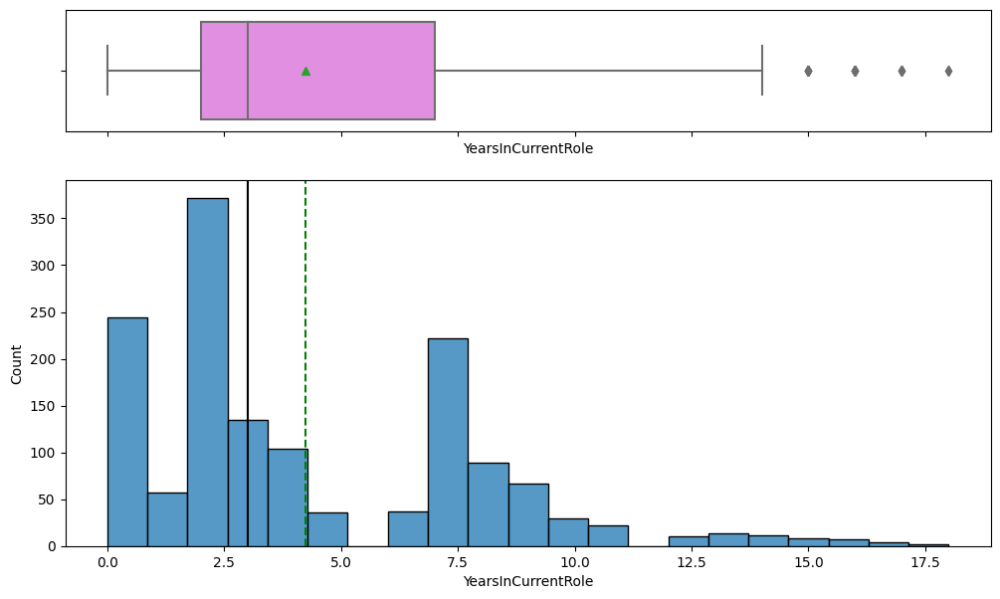

In [ ]:
histogram_boxplot(data,'YearsInCurrentRole')

### Observations on YearsInCurrentRole

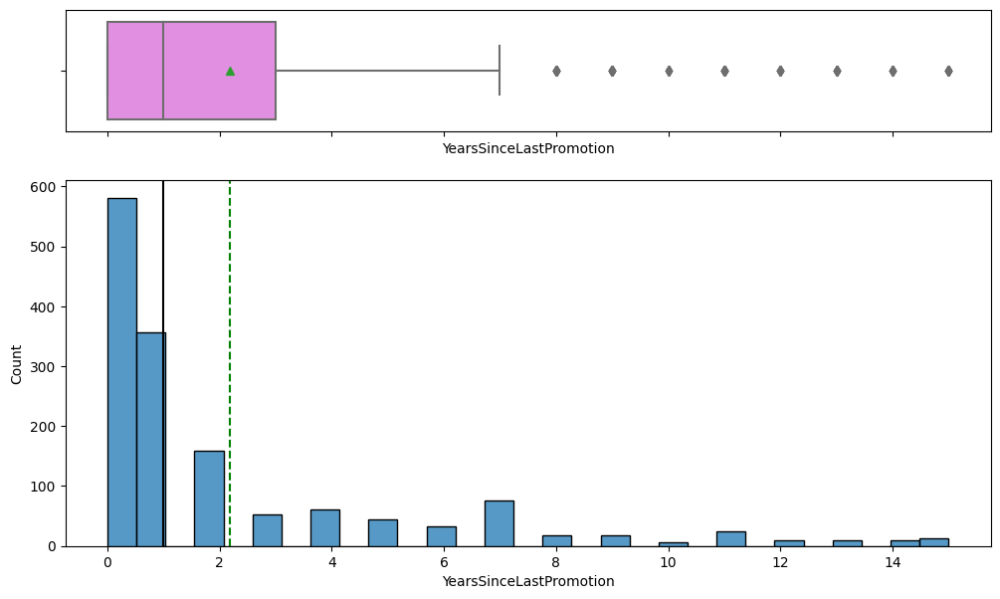

In [ ]:
histogram_boxplot(data,'YearsSinceLastPromotion')

### Observations on YearsWithCurrManager

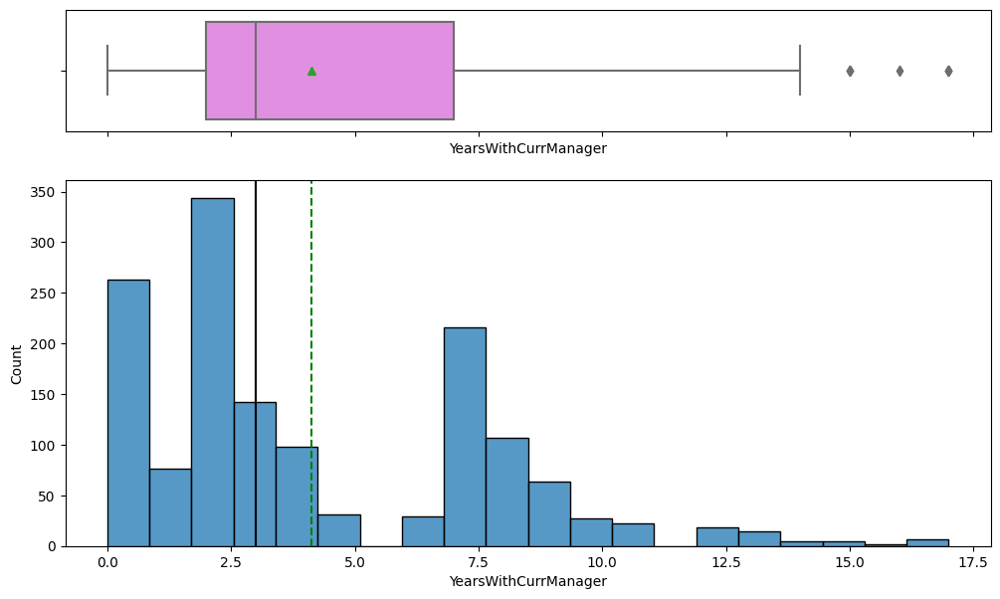

In [ ]:
histogram_boxplot(data,'YearsWithCurrManager')

In [ ]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

### Observations on BusinessTravel

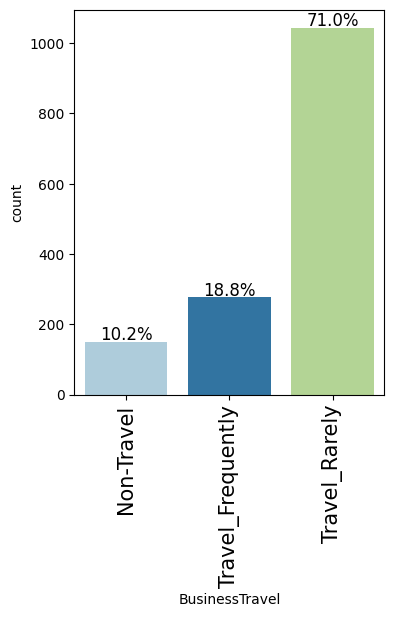

In [ ]:
labeled_barplot(data, "BusinessTravel", perc=True)

### Observations on Department

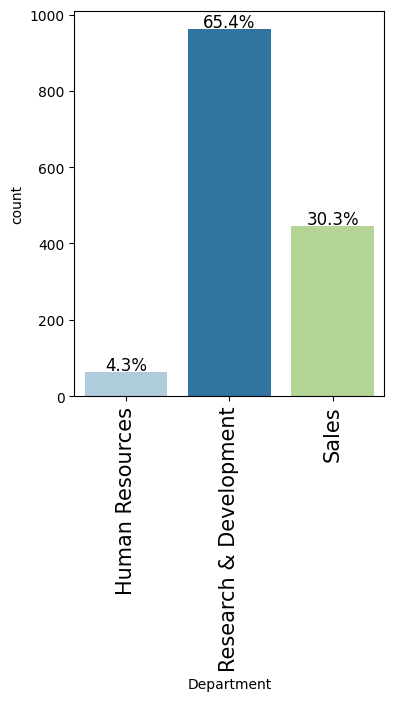

In [ ]:
labeled_barplot(data, "Department", perc=True)

### Observations on EducationField

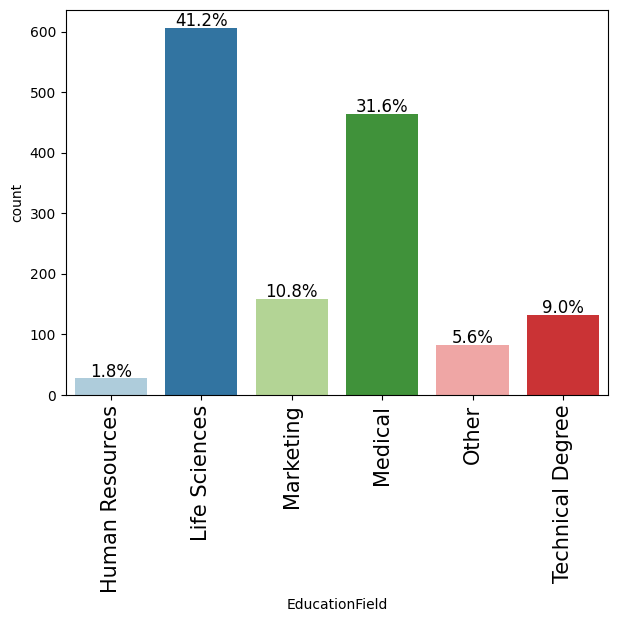

In [ ]:
labeled_barplot(data, "EducationField", perc=True)

### Observations on Gender

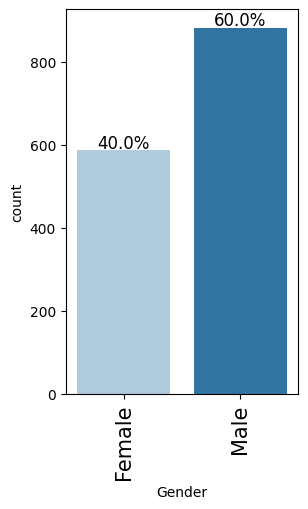

In [ ]:
labeled_barplot(data, "Gender", perc=True)

### Observations on JobRole

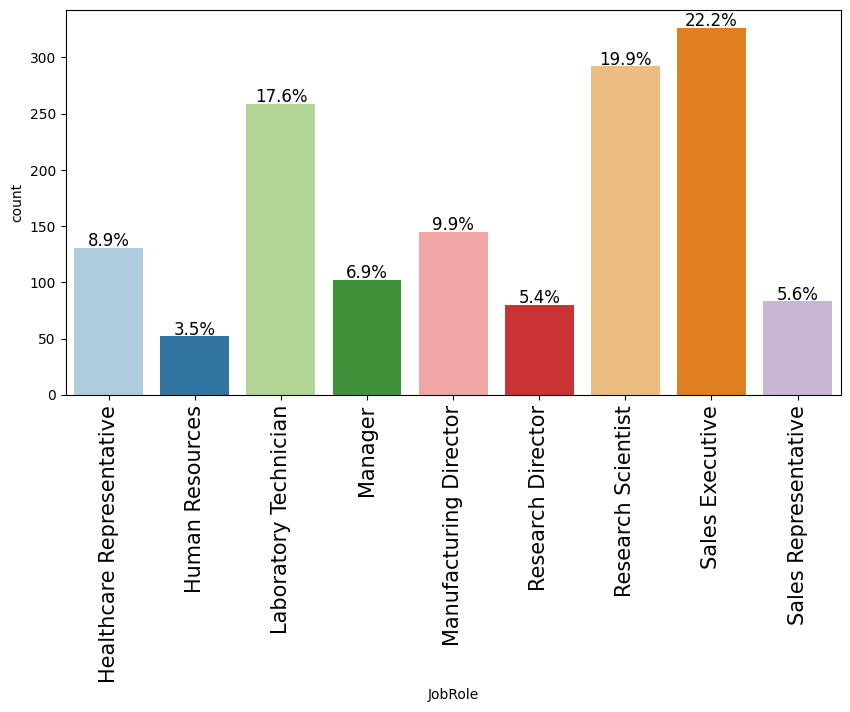

In [ ]:
labeled_barplot(data, "JobRole", perc=True)

### Observations on MaritalStatus

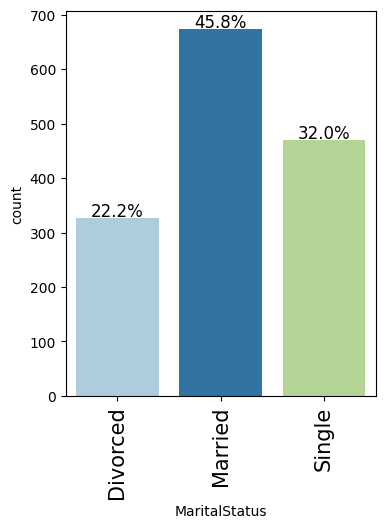

In [ ]:
labeled_barplot(data, "MaritalStatus", perc=True)

### Observations on OverTime

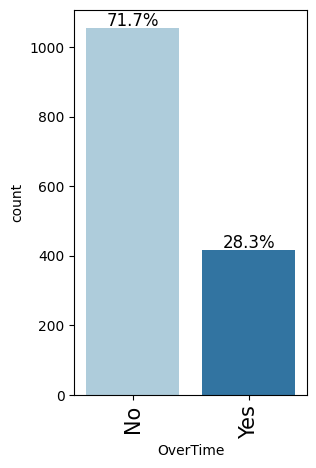

In [ ]:
labeled_barplot(data, "OverTime", perc=True)

### Observations on Attrition

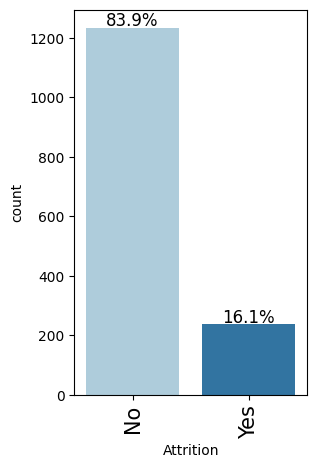

In [ ]:
labeled_barplot(data, "Attrition", perc=True)

## Bivariate Analysis

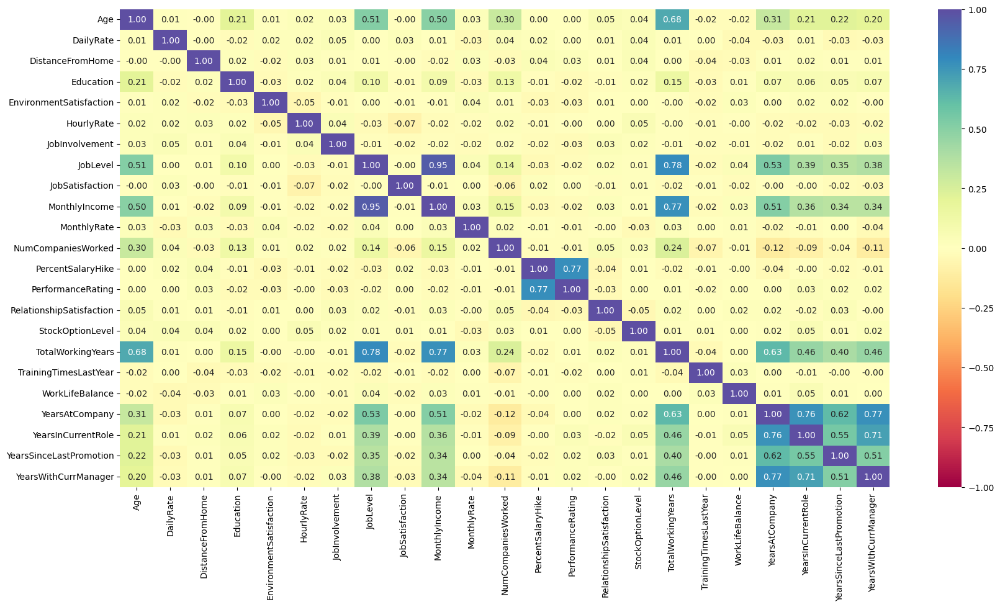

In [ ]:
plt.figure(figsize=(20,10))
sns.heatmap(data.corr(),annot=True,vmin=-1,vmax=1,fmt='.2f',cmap="Spectral")
plt.show()

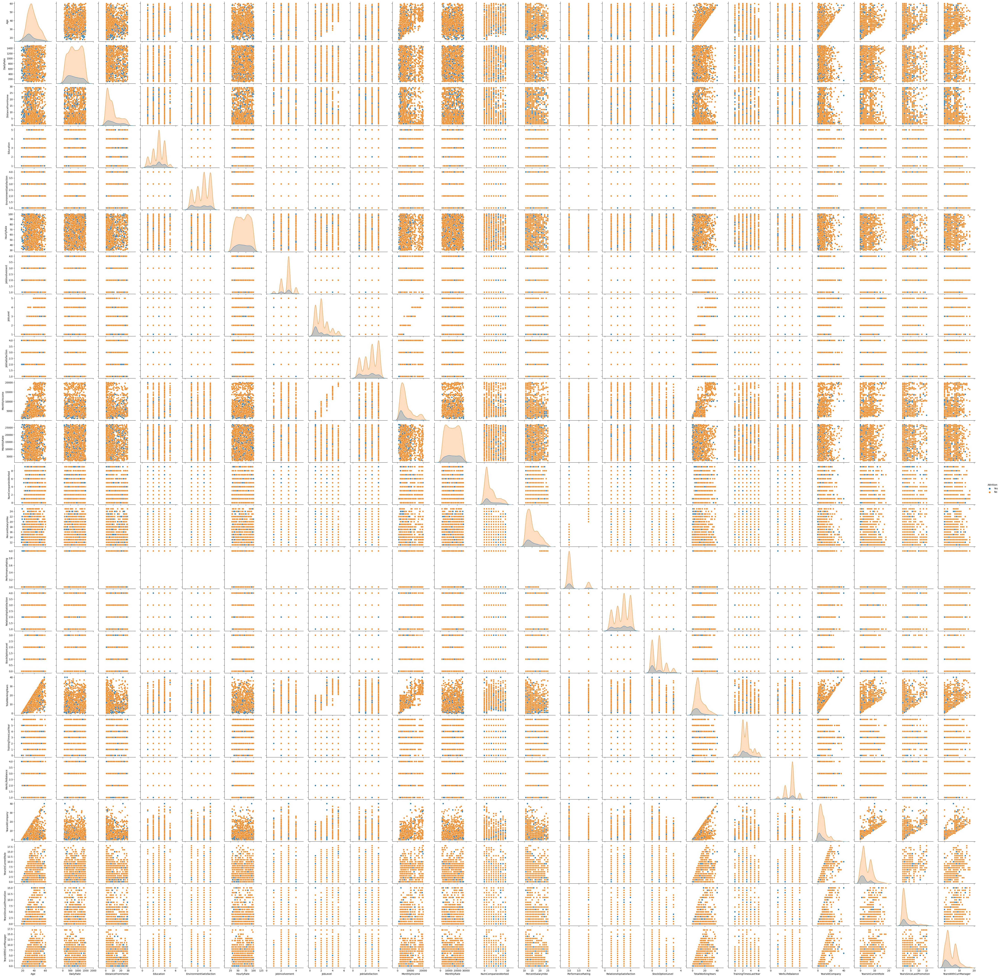

In [ ]:
sns.pairplot(data,hue='Attrition')
plt.show()

### Attrition vs Earnings of employee

### Attrition vs Previous job roles

* Employees who have to travel a more distance from their home attrite more.
* There is no difference in age and education of attriting and non-attriting employees.

In [ ]:
# function to plot stacked bar chart


def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 1, 5))
    plt.legend(
        loc="lower left",
        frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

Attrition            No  Yes   All
BusinessTravel                    
All                1233  237  1470
Travel_Rarely       887  156  1043
Travel_Frequently   208   69   277
Non-Travel          138   12   150
------------------------------------------------------------------------------------------------------------------------


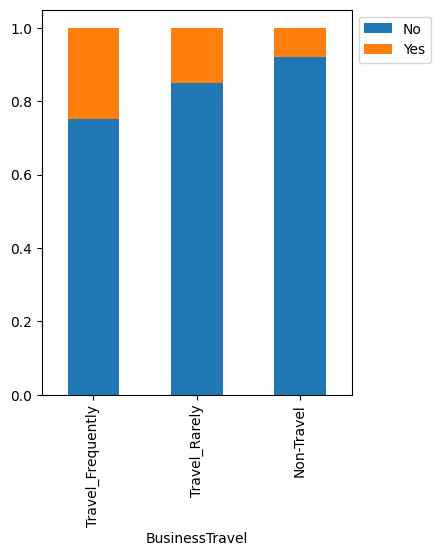

In [ ]:
stacked_barplot(data, "BusinessTravel", "Attrition")

Attrition                 No  Yes   All
Department                             
All                     1233  237  1470
Research & Development   828  133   961
Sales                    354   92   446
Human Resources           51   12    63
------------------------------------------------------------------------------------------------------------------------


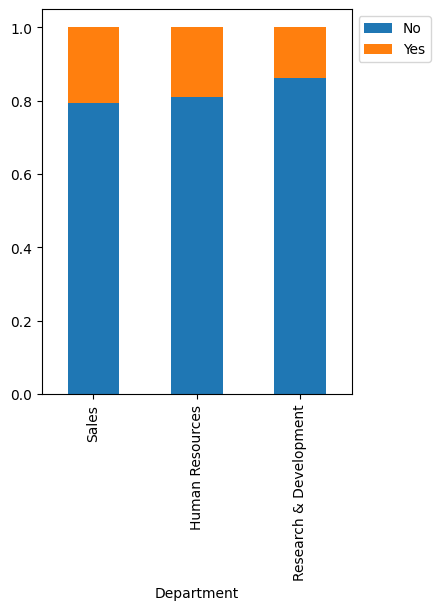

In [ ]:
stacked_barplot(data, "Department", "Attrition")

Attrition           No  Yes   All
EducationField                   
All               1233  237  1470
Life Sciences      517   89   606
Medical            401   63   464
Marketing          124   35   159
Technical Degree   100   32   132
Other               71   11    82
Human Resources     20    7    27
------------------------------------------------------------------------------------------------------------------------


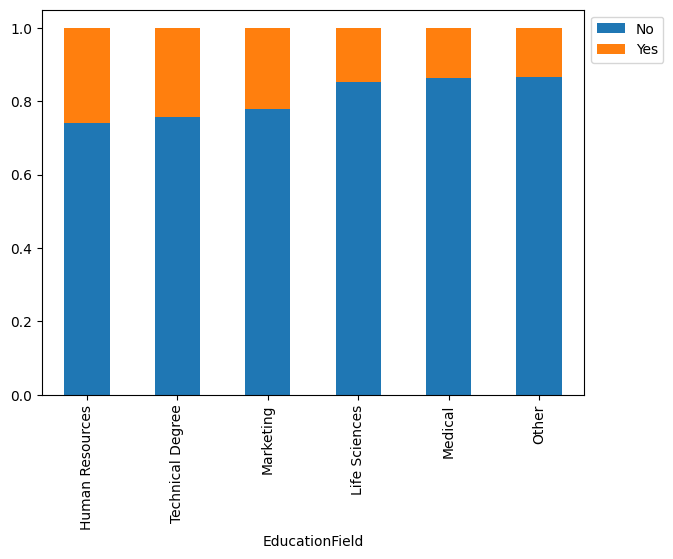

In [ ]:
stacked_barplot(data,"EducationField","Attrition")

Attrition                  No  Yes   All
EnvironmentSatisfaction                 
All                      1233  237  1470
1                         212   72   284
3                         391   62   453
4                         386   60   446
2                         244   43   287
------------------------------------------------------------------------------------------------------------------------


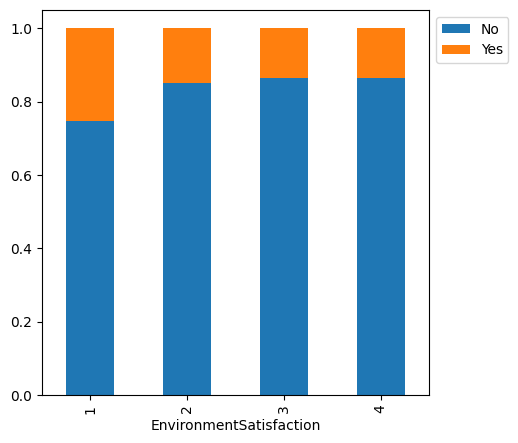

In [ ]:
stacked_barplot(data,"EnvironmentSatisfaction","Attrition")

Attrition         No  Yes   All
JobInvolvement                 
All             1233  237  1470
3                743  125   868
2                304   71   375
1                 55   28    83
4                131   13   144
------------------------------------------------------------------------------------------------------------------------


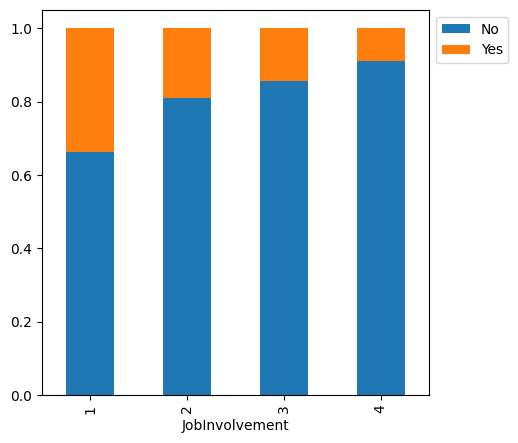

In [ ]:
stacked_barplot(data,"JobInvolvement","Attrition")

Attrition    No  Yes   All
JobLevel                  
All        1233  237  1470
1           400  143   543
2           482   52   534
3           186   32   218
4           101    5   106
5            64    5    69
------------------------------------------------------------------------------------------------------------------------


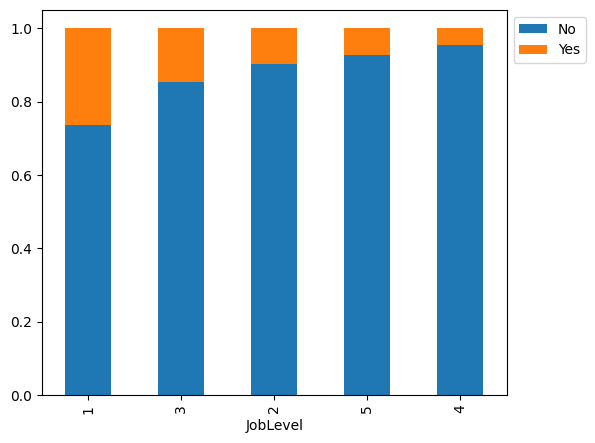

In [ ]:
stacked_barplot(data,"JobLevel","Attrition")

Attrition                    No  Yes   All
JobRole                                   
All                        1233  237  1470
Laboratory Technician       197   62   259
Sales Executive             269   57   326
Research Scientist          245   47   292
Sales Representative         50   33    83
Human Resources              40   12    52
Manufacturing Director      135   10   145
Healthcare Representative   122    9   131
Manager                      97    5   102
Research Director            78    2    80
------------------------------------------------------------------------------------------------------------------------


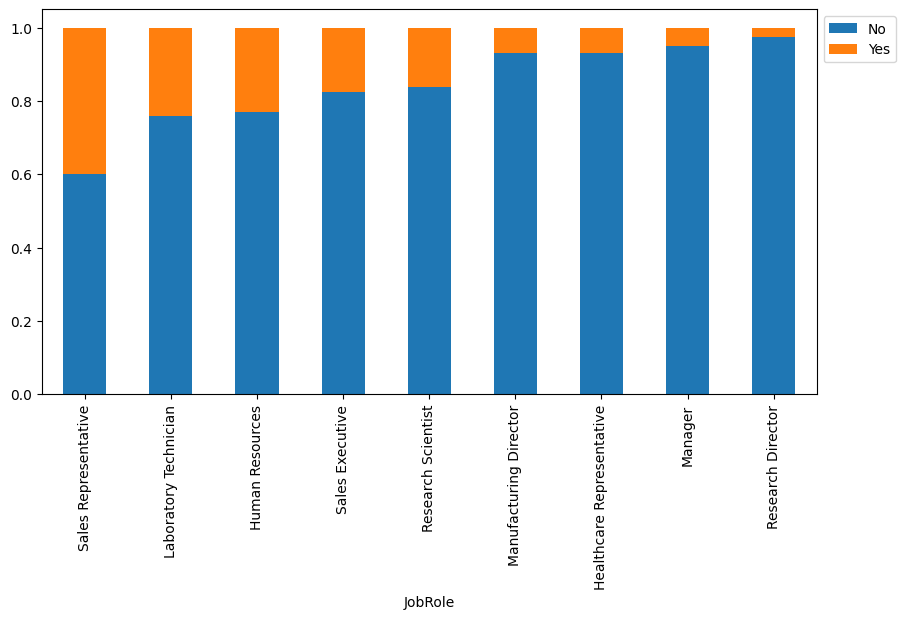

In [ ]:
stacked_barplot(data,"JobRole","Attrition")

Attrition          No  Yes   All
JobSatisfaction                 
All              1233  237  1470
3                 369   73   442
1                 223   66   289
4                 407   52   459
2                 234   46   280
------------------------------------------------------------------------------------------------------------------------


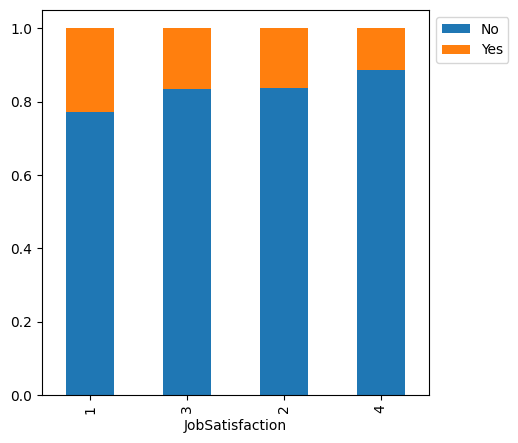

In [ ]:
stacked_barplot(data,"JobSatisfaction","Attrition")

Attrition        No  Yes   All
MaritalStatus                 
All            1233  237  1470
Single          350  120   470
Married         589   84   673
Divorced        294   33   327
------------------------------------------------------------------------------------------------------------------------


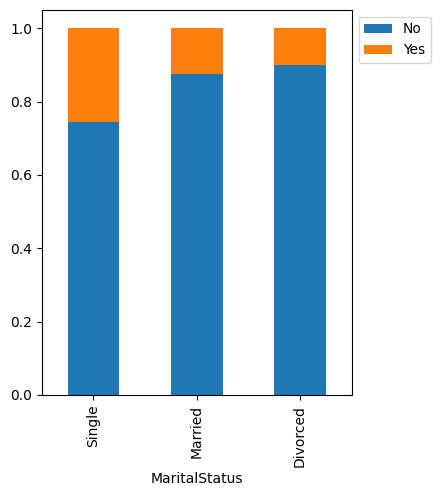

In [ ]:
stacked_barplot(data,"MaritalStatus","Attrition")

Attrition    No  Yes   All
OverTime                  
All        1233  237  1470
Yes         289  127   416
No          944  110  1054
------------------------------------------------------------------------------------------------------------------------


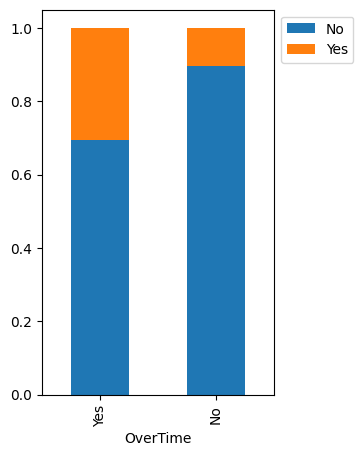

In [ ]:
stacked_barplot(data,"OverTime","Attrition")

Attrition                   No  Yes   All
RelationshipSatisfaction                 
All                       1233  237  1470
3                          388   71   459
4                          368   64   432
1                          219   57   276
2                          258   45   303
------------------------------------------------------------------------------------------------------------------------


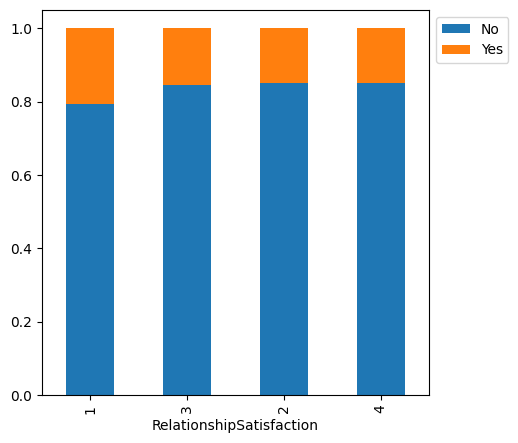

In [ ]:
stacked_barplot(data,"RelationshipSatisfaction","Attrition")

Attrition           No  Yes   All
StockOptionLevel                 
All               1233  237  1470
0                  477  154   631
1                  540   56   596
3                   70   15    85
2                  146   12   158
------------------------------------------------------------------------------------------------------------------------


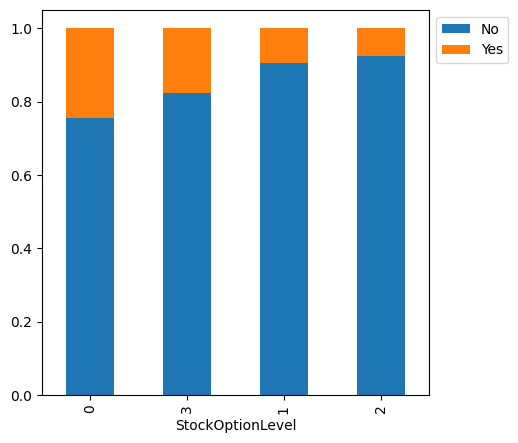

In [ ]:
stacked_barplot(data,"StockOptionLevel","Attrition")

Attrition          No  Yes   All
WorkLifeBalance                 
All              1233  237  1470
3                 766  127   893
2                 286   58   344
4                 126   27   153
1                  55   25    80
------------------------------------------------------------------------------------------------------------------------


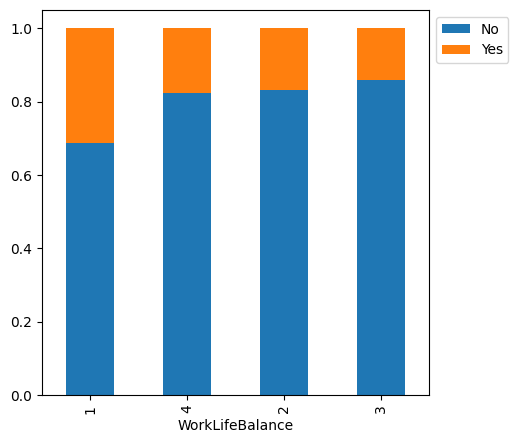

In [ ]:
stacked_barplot(data,"WorkLifeBalance","Attrition")

**Checking if performace rating and salary hike are related-**

## Model Building - Approach
1. Data preparation
2. Partition the data into train and test set.
3. Build model on the train data.
4. Tune the model if required.
5. Test the data on test set.

## Split Data

* When classification problems exhibit a significant imbalance in the distribution of the target classes, it is good to use stratified sampling to ensure that relative class frequencies are approximately preserved in train and test sets. 
* This is done using the `stratify` parameter in the train_test_split function.

In [ ]:
X = data.drop(['Attrition'],axis=1)
X = pd.get_dummies(X,drop_first=True)
y = data['Attrition'].apply(lambda x : 1 if x=='Yes' else 0)

In [ ]:
# Splitting data into training and test set:
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size=0.3, random_state=1,stratify=y)
print(X_train.shape, X_test.shape)

(1029, 44) (441, 44)


In [ ]:
y.value_counts(1)

0    0.838776
1    0.161224
Name: Attrition, dtype: float64

In [ ]:
y_test.value_counts(1)

0    0.839002
1    0.160998
Name: Attrition, dtype: float64

In [ ]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1,
        },
        index=[0],
    )

    return df_perf

In [ ]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

## Build Decision Tree Model

In [ ]:
dtree = DecisionTreeClassifier(criterion='gini',class_weight={0:0.17,1:0.83},random_state=1)

In [ ]:
dtree.fit(X_train, y_train)

DecisionTreeClassifier(class_weight={0: 0.17, 1: 0.83}, random_state=1)

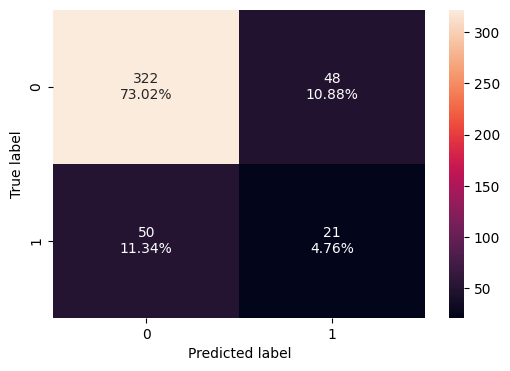

In [ ]:
confusion_matrix_sklearn(dtree, X_test, y_test)

In [ ]:
dtree_model_train_perf=model_performance_classification_sklearn(dtree, X_train, y_train)
print("Training performance \n",dtree_model_train_perf)

Training performance 
    Accuracy  Recall  Precision   F1
0       1.0     1.0        1.0  1.0


In [ ]:
dtree_model_test_perf=model_performance_classification_sklearn(dtree, X_test, y_test)
print("Testing performance \n",dtree_model_test_perf)

Testing performance 
    Accuracy    Recall  Precision   F1
0  0.777778  0.295775   0.304348  0.3


### Random Forest

In [ ]:
rf = RandomForestClassifier(random_state=1)
rf.fit(X_train,y_train)

RandomForestClassifier(random_state=1)

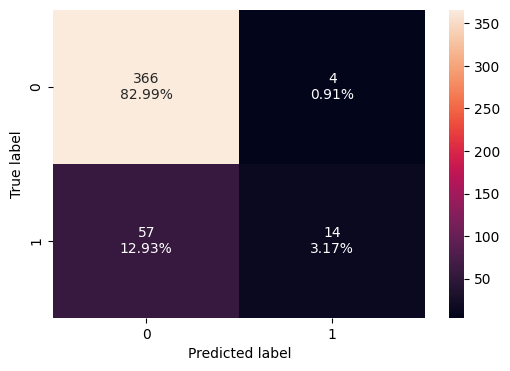

In [ ]:
confusion_matrix_sklearn(rf,X_test,y_test)

In [ ]:
rf_model_train_perf=model_performance_classification_sklearn(rf,X_train,y_train)
print("Training performance \n",rf_model_train_perf)

Training performance 
    Accuracy  Recall  Precision   F1
0       1.0     1.0        1.0  1.0


In [ ]:
rf_model_test_perf=model_performance_classification_sklearn(rf,X_test,y_test)
print("Testing performance \n",rf_model_test_perf)

Testing performance 
    Accuracy    Recall  Precision        F1
0  0.861678  0.197183   0.777778  0.314607


* Random Forest has performed well in terms of accuracy and precision, but it is not able to generalize well on the test data in terms of recall.

### Tuning Models

### Using GridSearch for Hyperparameter tuning model

**Tuning Decision Tree**

In [ ]:
# Choose the type of classifier. 
dtree_estimator = DecisionTreeClassifier(random_state=1)

# Grid of parameters to choose from
parameters = {'max_depth': np.arange(2,30), 
              'min_samples_leaf': [1, 2, 5, 7, 10],
              'max_leaf_nodes' : [2, 3, 5, 10,15, None],
              'min_impurity_decrease': [0.0001,0.001,0.01,0.1]
             }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(dtree_estimator, parameters, scoring=scorer)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
dtree_estimator = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
dtree_estimator.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=10, min_impurity_decrease=0.0001,
                       min_samples_leaf=2, random_state=1)

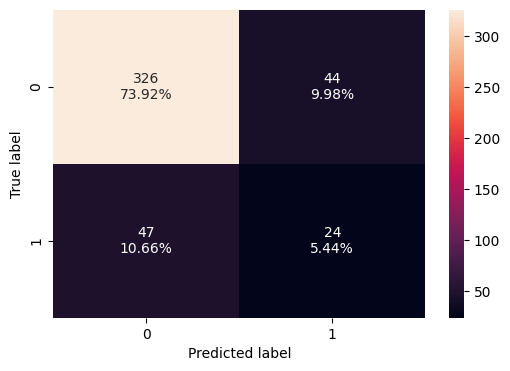

In [ ]:
confusion_matrix_sklearn(dtree_estimator, X_test,y_test)

In [ ]:
dtree_estimator_model_train_perf=model_performance_classification_sklearn(dtree_estimator, X_train,y_train)
print("Training performance \n",dtree_estimator_model_train_perf)

Training performance 
    Accuracy    Recall  Precision        F1
0  0.956268  0.759036   0.961832  0.848485


In [ ]:
dtree_estimator_model_test_perf=model_performance_classification_sklearn(dtree_estimator, X_test, y_test)
print("Testing performance \n",dtree_estimator_model_test_perf)

Testing performance 
    Accuracy    Recall  Precision        F1
0  0.793651  0.338028   0.352941  0.345324


* Overfitting in decision tree has reduced but the recall has also reduced.

**Tuning Random Forest**

In [ ]:
# Choose the type of classifier. 
rf_estimator = RandomForestClassifier(random_state=1)

# Grid of parameters to choose from
parameters = {  
        "n_estimators": [110,251,501],
        "min_samples_leaf": np.arange(1, 6,1),
        "max_features": [0.7,0.9,'log2','auto'],
        "max_samples": [0.7,0.9,None],
}

# Run the grid search
grid_obj = GridSearchCV(rf_estimator, parameters, scoring='recall',cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
rf_estimator = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
rf_estimator.fit(X_train, y_train)

RandomForestClassifier(max_features=0.7, max_samples=0.7, min_samples_leaf=2,
                       n_estimators=110, random_state=1)

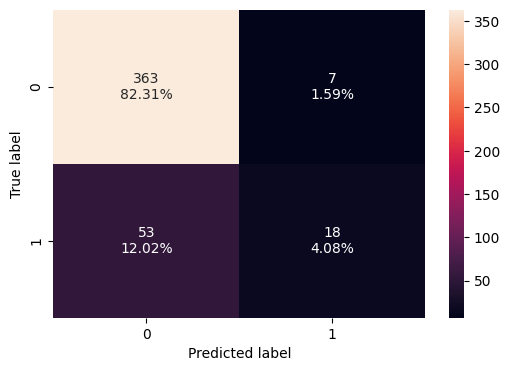

In [ ]:
confusion_matrix_sklearn(rf_estimator, X_test,y_test)

In [ ]:
rf_estimator_model_train_perf=model_performance_classification_sklearn(rf_estimator, X_train,y_train)
print("Training performance \n",rf_estimator_model_train_perf)

Training performance 
    Accuracy    Recall  Precision        F1
0  0.965986  0.789157        1.0  0.882155


In [ ]:
rf_estimator_model_test_perf=model_performance_classification_sklearn(rf_estimator, X_test, y_test)
print("Testing performance \n",rf_estimator_model_test_perf)

Testing performance 
    Accuracy    Recall  Precision     F1
0  0.863946  0.253521       0.72  0.375


* Random forest after tuning has given same performance as un-tuned random forest.

### Comparing all the models

In [ ]:
# training performance comparison

models_train_comp_df = pd.concat(
    [dtree_model_train_perf.T, rf_model_train_perf.T,
   dtree_estimator_model_train_perf.T, rf_estimator_model_train_perf.T],
    axis=1,
)
models_train_comp_df.columns = [
    "Decision Tree",
    "Random Forest Classifier",
    "Decision Tree Estimator",
    "Random Forest Estimator"]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Decision Tree,Random Forest Classifier,Decision Tree Estimator,Random Forest Estimator
Accuracy,1.0,1.0,0.956268,0.965986
Recall,1.0,1.0,0.759036,0.789157
Precision,1.0,1.0,0.961832,1.000000
F1,1.0,1.0,0.848485,0.882155


In [ ]:
# training performance comparison

models_test_comp_df = pd.concat(
    [dtree_model_test_perf.T,rf_model_test_perf.T,
   dtree_estimator_model_test_perf.T,rf_estimator_model_test_perf.T],
    axis=1,
)
models_test_comp_df.columns = [
    "Decision Tree",
    "Random Forest Classifier",
    "Decision Tree Estimator",
    "Random Forest Estimator"]
print("Testing performance comparison:")
models_test_comp_df

Testing performance comparison:


,Decision Tree,Random Forest Classifier,Decision Tree Estimator,Random Forest Estimator
Accuracy,0.777778,0.861678,0.793651,0.863946
Recall,0.295775,0.197183,0.338028,0.253521
Precision,0.304348,0.777778,0.352941,0.720000
F1,0.300000,0.314607,0.345324,0.375000


### Feature importance of Random Forest

In [ ]:
feature_names = X_train.columns

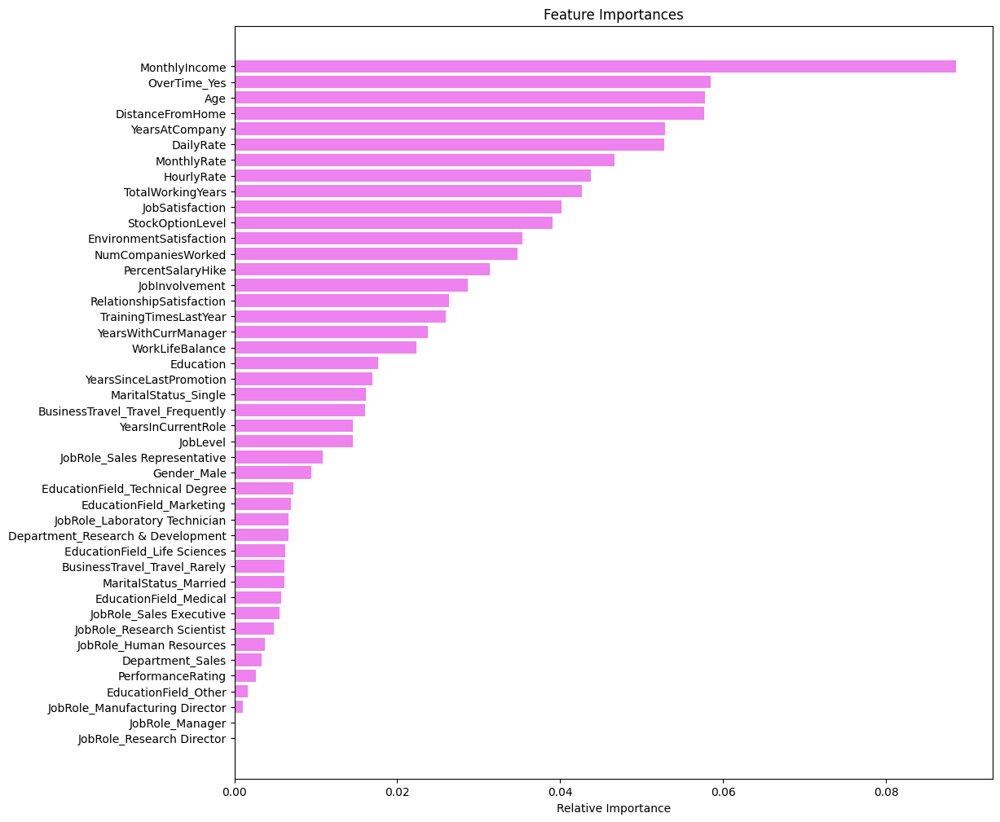

In [ ]:
importances = rf_estimator.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

Age                                  0.052973
DailyRate                            0.055963
DistanceFromHome                     0.049495
Education                            0.023381
EnvironmentSatisfaction              0.028558
HourlyRate                           0.043540
JobInvolvement                       0.028282
JobLevel                             0.021935
JobSatisfaction                      0.030991
MonthlyIncome                        0.068632
MonthlyRate                          0.051593
NumCompaniesWorked                   0.034709
PercentSalaryHike                    0.033588
PerformanceRating                    0.005043
RelationshipSatisfaction             0.024631
StockOptionLevel                     0.037565
TotalWorkingYears                    0.046934
TrainingTimesLastYear                0.027650
WorkLifeBalance                      0.024035
YearsAtCompany                       0.044930
YearsInCurrentRole                   0.027767
YearsSinceLastPromotion           

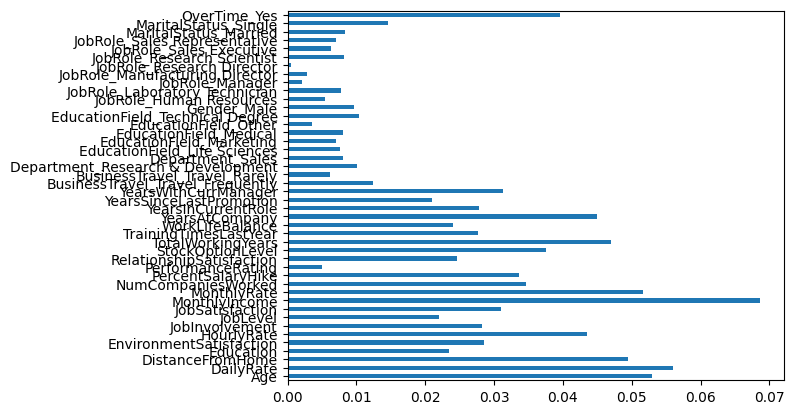

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

# Initialize the Random Forest Classifier
rfc = RandomForestClassifier()

# Define the hyperparameter grid to search over
param_grid = {'n_estimators': [100, 200, 300],
              'max_depth': [5, 10, None],
              'min_samples_split': [2, 5, 10],
              'min_samples_leaf': [1, 2, 4]}

# Perform grid search using 5-fold cross-validation
grid_search = GridSearchCV(estimator=rfc, param_grid=param_grid, cv=5)

# Fit the grid search object to the training data
grid_search.fit(X_train, y_train)

# Print the feature importances of the best estimator
importances = pd.Series(grid_search.best_estimator_.feature_importances_, index=X_train.columns)
print(importances)

# Plot the feature importances
importances.plot(kind='barh')
plt.show()